# Business Objective:

The obejctive of this project is to find whether a customer is a loan defaulter(somwone who is unable to repay the loan to the bank), from the dataset of house building loan. In this process, we have to check the precision and accuracy of a ML model, to find whether it is suitable to predict a loan defaulter or not. 

# Importing the libraries

In [1]:
pip install pydotplus

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install mlxtend

In [3]:
pip install category_encoders

Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

# import train-test split
from sklearn.model_selection import train_test_split

# import various functions from statsmodels
import statsmodels
import statsmodels.api as sm

# import 'stats'
import scipy.stats
from scipy import stats

# 'metrics' from sklearn is used for evaluating the model performance
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error


# import function to perform linear regression
from sklearn.linear_model import LinearRegression

# import function to perform logistic regression
from sklearn.linear_model import LogisticRegression


# import StandardScaler to perform scaling
from sklearn.preprocessing import StandardScaler

# import SGDRegressor from sklearn to perform linear regression with stochastic gradient descent
from sklearn.linear_model import SGDRegressor

# import function for ridge regression
from sklearn.linear_model import Ridge

# import function for lasso regression
from sklearn.linear_model import Lasso

# import function for elastic net regression
from sklearn.linear_model import ElasticNet

# import function to perform GridSearchCV
from sklearn.model_selection import GridSearchCV

import os
os.getcwd()
# os.chdir("C:\Users\HP")
# os.getcwd()

pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None
 
# to display the float values upto 6 decimal places     
pd.options.display.float_format = '{:.6f}'.format

import statsmodels.stats.api as sms
import statsmodels.tsa.api as smt

from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.outliers_influence import variance_inflation_factor


# import various functions from scipy
from scipy import stats

# functions for forward selection
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.feature_selection import RFE

# functions for linear regression
from sklearn.linear_model import LinearRegression

# functions for  cross validation
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn import preprocessing

from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB

# import the functions for visualizing the decision tree
import pydotplus
from IPython.display import Image  

# Importing & Loading the Dataset

In [5]:
df = pd.read_csv('loan_data.csv')
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.000000,406597.500000,24700.500000,351000.000000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.000000,-2120,NaN,1,1,0,1,1,0,Laborers,1.000000,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.024700,0.036900,0.972200,0.619200,0.014300,0.000000,0.069000,0.083300,0.125000,0.036900,0.020200,0.019000,0.000000,0.000000,0.025200,0.038300,0.972200,0.634100,0.014400,0.000000,0.069000,0.083300,0.125000,0.037700,0.022000,0.019800,0.000000,0.000000,0.025000,0.036900,0.972200,0.624300,0.014400,0.000000,0.069000,0.083300,0.125000,0.037500,0.020500,0.019300,0.000000,0.000000,reg oper account,block of flats,0.014900,"Stone, brick",No,2.000000,2.000000,2.000000,2.000000,-1134.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
1,100003,0,Cash loans,F,N,N,0,270000.000000,1293502.500000,35698.500000,1129500.000000,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.000000,-291,NaN,1,1,0,1,1,0,Core staff,2.000000,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.095900,0.052900,0.985100,0.796000,0.060500,0.080000,0.034500,0.291700,0.333300,0.013000,0.077300,0.054900,0.003900,0.009800,0.092400,0.053800,0.985100,0.804000,0.049700,0.080600,0.034500,0.291700,0.333300,0.012800,0.079000,0.055400,0.000000,0.000000,0.096800,0.052900,0.985100,0.798700,0.060800,0.080000,0.034500,0.291700,0.333300,0.013200,0.078700,0.055800,0.003900,0.010000,reg oper account,block of flats,0.071400,Block,No,1.000000,0.000000,1.000000,0.000000,-828.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,100004,0,Revolving loans,M,Y,Y,0,675

# Dataset information

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


# Dataset shape

In [7]:
df.shape

(307511, 122)

In [8]:
#percentage distribution of target variable

df.TARGET.value_counts(normalize = True).mul(100).round(1).astype(str) + '%'

0    91.9%
1     8.1%
Name: TARGET, dtype: object

# Data cleaning

### Data Preprocessing (handling null values for numerical and categorical variables)

In [9]:
#working with categorical variables

In [10]:
df_cat = df.select_dtypes(exclude = np.number)
df_cat.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

In [11]:
#percentage distribution of values in each categorical variable

for i in df_cat.columns:
    print(df_cat[i].value_counts(normalize = True).mul(100).round(1).astype(str) + '%')

Cash loans         90.5%
Revolving loans     9.5%
Name: NAME_CONTRACT_TYPE, dtype: object
F      65.8%
M      34.2%
XNA     0.0%
Name: CODE_GENDER, dtype: object
N    66.0%
Y    34.0%
Name: FLAG_OWN_CAR, dtype: object
Y    69.4%
N    30.6%
Name: FLAG_OWN_REALTY, dtype: object
Unaccompanied      81.2%
Family             13.1%
Spouse, partner     3.7%
Children            1.1%
Other_B             0.6%
Other_A             0.3%
Group of people     0.1%
Name: NAME_TYPE_SUITE, dtype: object
Working                 51.6%
Commercial associate    23.3%
Pensioner               18.0%
State servant            7.1%
Unemployed               0.0%
Student                  0.0%
Businessman              0.0%
Maternity leave          0.0%
Name: NAME_INCOME_TYPE, dtype: object
Secondary / secondary special    71.0%
Higher education                 24.3%
Incomplete higher                 3.3%
Lower secondary                   1.2%
Academic degree                   0.1%
Name: NAME_EDUCATION_TYPE, dtype: obje

In [12]:
#converting the datatype from object to category

df_cat = df_cat.astype('category')

In [13]:
#removing unnecessary values having no to '0%'

df_cat['CODE_GENDER'] = df_cat['CODE_GENDER'].cat.remove_categories('XNA')
df_cat['NAME_TYPE_SUITE'] = df_cat['NAME_TYPE_SUITE'].cat.remove_categories(['Other_B','Other_A','Group of people'])
df_cat['NAME_INCOME_TYPE']  = df_cat['NAME_INCOME_TYPE'].cat.remove_categories(['Unemployed','Student','Businessman','Maternity leave'])   
df_cat['NAME_EDUCATION_TYPE'] = df_cat['NAME_EDUCATION_TYPE'].cat.remove_categories('Academic degree')
df_cat['NAME_FAMILY_STATUS'] = df_cat['NAME_FAMILY_STATUS'].cat.remove_categories('Unknown')
df_cat['NAME_HOUSING_TYPE'] = df_cat['NAME_HOUSING_TYPE'].cat.remove_categories(['Co-op apartment','Co-op apartment'])
df_cat['OCCUPATION_TYPE'] = df_cat['OCCUPATION_TYPE'].cat.remove_categories(['Waiters/barmen staff','Secretaries','Realty agents','HR staff','IT staff'])
df_cat['ORGANIZATION_TYPE'] = df_cat['ORGANIZATION_TYPE'].cat.remove_categories(['Military','Bank','Agriculture','Police','Postal','Restaurant','Services','University',
                                                                                  'Hotel','University','Insurance','Telecom','Emergency','Advertising','Realtor','Culture',
                                                                                  'Mobile','Legal Services','Cleaning','Religion'])
df_cat['HOUSETYPE_MODE'] = df_cat['HOUSETYPE_MODE'].cat.remove_categories('terraced house')

In [14]:
#detecting columns with null values

(df_cat.isnull().sum()/(df.index.size)*100)[df_cat.isnull().sum()/(df.index.size)*100 >50].sort_values(ascending=False)

FONDKAPREMONT_MODE   68.386172
WALLSMATERIAL_MODE   50.840783
HOUSETYPE_MODE       50.570224
dtype: float64

In [15]:
#removing columns with more than 50% null values

nan_ratio= df_cat.isna().mean(axis='index')
cols_to_drop= nan_ratio.index[nan_ratio>=0.5].to_list()
df_cat.drop(columns=cols_to_drop, inplace=True)

In [16]:
(df_cat.isnull().sum()/(df.index.size)*100)[df_cat.isnull().sum()/(df.index.size)*100 >0].sort_values(ascending=False)

EMERGENCYSTATE_MODE   47.398304
OCCUPATION_TYPE       32.806631
ORGANIZATION_TYPE      7.049179
NAME_TYPE_SUITE        1.365480
NAME_HOUSING_TYPE      0.364865
NAME_EDUCATION_TYPE    0.053331
NAME_INCOME_TYPE       0.017886
CODE_GENDER            0.001301
NAME_FAMILY_STATUS     0.000650
dtype: float64

In [17]:
#using 'simple imputaer' imputing the null values with 'most freuent' value or 'mode'

from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan,strategy='most_frequent')

imputer.fit(df_cat.iloc[:,:])

SimpleImputer(strategy='most_frequent')

In [18]:
df_cat_trans = imputer.transform(df_cat)
df_cat= pd.DataFrame(df_cat_trans,columns=df_cat.columns)
df_cat.isnull().sum()

NAME_CONTRACT_TYPE            0
CODE_GENDER                   0
FLAG_OWN_CAR                  0
FLAG_OWN_REALTY               0
NAME_TYPE_SUITE               0
NAME_INCOME_TYPE              0
NAME_EDUCATION_TYPE           0
NAME_FAMILY_STATUS            0
NAME_HOUSING_TYPE             0
OCCUPATION_TYPE               0
WEEKDAY_APPR_PROCESS_START    0
ORGANIZATION_TYPE             0
EMERGENCYSTATE_MODE           0
dtype: int64

In [19]:
df_cat.shape

(307511, 13)

There are total 13 categorical columns.

In [20]:
#working with numerical variables

In [21]:
df_num = df.select_dtypes(include=np.number)
df_num.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.000000,406597.500000,24700.500000,351000.000000,0.018801,-9461,-637,-3648.000000,-2120,NaN,1,1,0,1,1,0,1.000000,2,2,10,0,0,0,0,0,0,0.083037,0.262949,0.139376,0.024700,0.036900,0.972200,0.619200,0.014300,0.000000,0.069000,0.083300,0.125000,0.036900,0.020200,0.019000,0.000000,0.000000,0.025200,0.038300,0.972200,0.634100,0.014400,0.000000,0.069000,0.083300,0.125000,0.037700,0.022000,0.019800,0.000000,0.000000,0.025000,0.036900,0.972200,0.624300,0.014400,0.000000,0.069000,0.083300,0.125000,0.037500,0.020500,0.019300,0.000000,0.000000,0.014900,2.000000,2.000000,2.000000,2.000000,-1134.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
1,100003,0,0,270000.000000,1293502.500000,35698.500000,1129500.000000,0.003541,-16765,-1188,-1186.000000,-291,NaN,1,1,0,1,1,0,2.000000,1,1,11,0,0,0,0,0,0,0.311267,0.622246,NaN,0.095900,0.052900,0.985100,0.796000,0.060500,0.080000,0.034500,0.291700,0.333300,0.013000,0.077300,0.054900,0.003900,0.009800,0.092400,0.053800,0.985100,0.804000,0.049700,0.080600,0.034500,0.291700,0.333300,0.012800,0.079000,0.055400,0.000000,0.000000,0.096800,0.052900,0.985100,0.798700,0.060800,0.080000,0.034500,0.291700,0.333300,0.013200,0.078700,0.055800,0.003900,0.010000,0.071400,1.000000,0.000000,1.000000,0.000000,-828.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,100004,0,0,67500.000000,135000.000000,6750.000000,135000.000000,0.010032,-19046,-225,-4260.000000,-2531,26.000000,1,1,1,1,1,0,1.000000,2,2,9,0,0,0,0,0,0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,-815.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,100006,0,0,135000.000000,312682.500000,29686.500000,297000.000000,0.008019,-19005,-3039,-9833.000000,-2437,NaN,1,1,0,1,0,0,2.000000,2,2,17,0,0,0,0,0,0,NaN,0.650442,NaN,NaN,NaN,

In [22]:
#detecting columns with more than 50% 'nan' values

(df_num.isnull().sum()/(df.index.size)*100)[df_num.isnull().sum()/(df.index.size)*100 > 50].sort_values(ascending=False)

COMMONAREA_AVG             69.872297
COMMONAREA_MODE            69.872297
COMMONAREA_MEDI            69.872297
NONLIVINGAPARTMENTS_AVG    69.432963
NONLIVINGAPARTMENTS_MEDI   69.432963
NONLIVINGAPARTMENTS_MODE   69.432963
LIVINGAPARTMENTS_MODE      68.354953
LIVINGAPARTMENTS_MEDI      68.354953
LIVINGAPARTMENTS_AVG       68.354953
FLOORSMIN_MODE             67.848630
FLOORSMIN_AVG              67.848630
FLOORSMIN_MEDI             67.848630
YEARS_BUILD_MODE           66.497784
YEARS_BUILD_AVG            66.497784
YEARS_BUILD_MEDI           66.497784
OWN_CAR_AGE                65.990810
LANDAREA_AVG               59.376738
LANDAREA_MEDI              59.376738
LANDAREA_MODE              59.376738
BASEMENTAREA_MODE          58.515956
BASEMENTAREA_MEDI          58.515956
BASEMENTAREA_AVG           58.515956
EXT_SOURCE_1               56.381073
NONLIVINGAREA_MODE         55.179164
NONLIVINGAREA_MEDI         55.179164
NONLIVINGAREA_AVG          55.179164
ELEVATORS_MODE             53.295980
E

In [23]:
#dropping columns with more than 50% 'nan' values

nan= df_num.isna().mean(axis='index')
cols= nan.index[nan>=0.5].to_list()
df_num.drop(columns=cols, inplace=True)

In [24]:
(df_num.isnull().sum()/(df.index.size)*100)[df_num.isnull().sum()/(df.index.size)*100 > 0].sort_values(ascending=False)

FLOORSMAX_AVG                  49.760822
FLOORSMAX_MODE                 49.760822
FLOORSMAX_MEDI                 49.760822
YEARS_BEGINEXPLUATATION_AVG    48.781019
YEARS_BEGINEXPLUATATION_MODE   48.781019
YEARS_BEGINEXPLUATATION_MEDI   48.781019
TOTALAREA_MODE                 48.268517
EXT_SOURCE_3                   19.825307
AMT_REQ_CREDIT_BUREAU_HOUR     13.501631
AMT_REQ_CREDIT_BUREAU_QRT      13.501631
AMT_REQ_CREDIT_BUREAU_MON      13.501631
AMT_REQ_CREDIT_BUREAU_WEEK     13.501631
AMT_REQ_CREDIT_BUREAU_DAY      13.501631
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
OBS_60_CNT_SOCIAL_CIRCLE        0.332021
DEF_60_CNT_SOCIAL_CIRCLE        0.332021
DEF_30_CNT_SOCIAL_CIRCLE        0.332021
OBS_30_CNT_SOCIAL_CIRCLE        0.332021
EXT_SOURCE_2                    0.214626
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
dtype: float64

In [25]:
##using 'simple imputaer' imputing the null values with 'median' value of each column

im = SimpleImputer(missing_values=np.nan,strategy='median')
im.fit(df_num.iloc[:,:])

SimpleImputer(strategy='median')

In [26]:
df_num_trans = im.transform(df_num)
df_num= pd.DataFrame(df_num_trans,columns=df_num.columns)
df_num.isnull().sum()

SK_ID_CURR                      0
TARGET                          0
CNT_CHILDREN                    0
AMT_INCOME_TOTAL                0
AMT_CREDIT                      0
AMT_ANNUITY                     0
AMT_GOODS_PRICE                 0
REGION_POPULATION_RELATIVE      0
DAYS_BIRTH                      0
DAYS_EMPLOYED                   0
DAYS_REGISTRATION               0
DAYS_ID_PUBLISH                 0
FLAG_MOBIL                      0
FLAG_EMP_PHONE                  0
FLAG_WORK_PHONE                 0
FLAG_CONT_MOBILE                0
FLAG_PHONE                      0
FLAG_EMAIL                      0
CNT_FAM_MEMBERS                 0
REGION_RATING_CLIENT            0
REGION_RATING_CLIENT_W_CITY     0
HOUR_APPR_PROCESS_START         0
REG_REGION_NOT_LIVE_REGION      0
REG_REGION_NOT_WORK_REGION      0
LIVE_REGION_NOT_WORK_REGION     0
REG_CITY_NOT_LIVE_CITY          0
REG_CITY_NOT_WORK_CITY          0
LIVE_CITY_NOT_WORK_CITY         0
EXT_SOURCE_2                    0
EXT_SOURCE_3  

In [27]:
#dropping unnecessary column

df_num.drop(columns= 'SK_ID_CURR', inplace=True)

In [28]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 67 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   TARGET                        307511 non-null  float64
 1   CNT_CHILDREN                  307511 non-null  float64
 2   AMT_INCOME_TOTAL              307511 non-null  float64
 3   AMT_CREDIT                    307511 non-null  float64
 4   AMT_ANNUITY                   307511 non-null  float64
 5   AMT_GOODS_PRICE               307511 non-null  float64
 6   REGION_POPULATION_RELATIVE    307511 non-null  float64
 7   DAYS_BIRTH                    307511 non-null  float64
 8   DAYS_EMPLOYED                 307511 non-null  float64
 9   DAYS_REGISTRATION             307511 non-null  float64
 10  DAYS_ID_PUBLISH               307511 non-null  float64
 11  FLAG_MOBIL                    307511 non-null  float64
 12  FLAG_EMP_PHONE                307511 non-nul

In [29]:
df_num.shape

(307511, 67)

There are total 67 numerical columns.

## EDA

### Univariate Analysis

AxesSubplot(0.125,0.653529;0.227941x0.226471)
AxesSubplot(0.398529,0.653529;0.227941x0.226471)
AxesSubplot(0.672059,0.653529;0.227941x0.226471)
AxesSubplot(0.125,0.381765;0.227941x0.226471)
AxesSubplot(0.398529,0.381765;0.227941x0.226471)
AxesSubplot(0.672059,0.381765;0.227941x0.226471)
AxesSubplot(0.125,0.11;0.227941x0.226471)
AxesSubplot(0.398529,0.11;0.227941x0.226471)
AxesSubplot(0.672059,0.11;0.227941x0.226471)


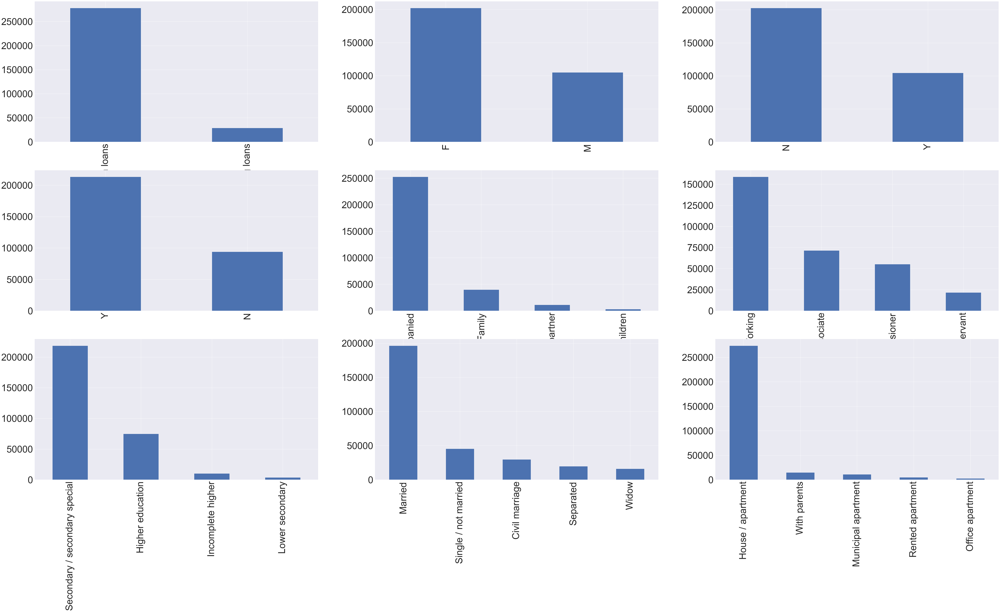

In [30]:
#plotting 'bar graphs' for individual categorial variables

plt.figure(figsize = (100,50))
sns.set(font_scale = 5)
plt.subplot(331)
print(df_cat['NAME_CONTRACT_TYPE'].value_counts().plot(kind="bar"))
plt.subplot(332)
print(df_cat['CODE_GENDER'].value_counts().plot(kind="bar"))
plt.subplot(333)
print(df_cat['FLAG_OWN_CAR'].value_counts().plot(kind="bar"))
plt.subplot(334)
print(df_cat['FLAG_OWN_REALTY'].value_counts().plot(kind="bar"))
plt.subplot(335)
print(df_cat['NAME_TYPE_SUITE'].value_counts().plot(kind="bar"))
plt.subplot(336)
print(df_cat['NAME_INCOME_TYPE'].value_counts().plot(kind="bar"))
plt.subplot(337)
print(df_cat['NAME_EDUCATION_TYPE'].value_counts().plot(kind="bar"))
plt.subplot(338)
print(df_cat['NAME_FAMILY_STATUS'].value_counts().plot(kind="bar"))
plt.subplot(339)
print(df_cat['NAME_HOUSING_TYPE'].value_counts().plot(kind="bar"))

AxesSubplot(0.125,0.53;0.352273x0.35)
AxesSubplot(0.547727,0.53;0.352273x0.35)
AxesSubplot(0.125,0.11;0.352273x0.35)
AxesSubplot(0.547727,0.11;0.352273x0.35)


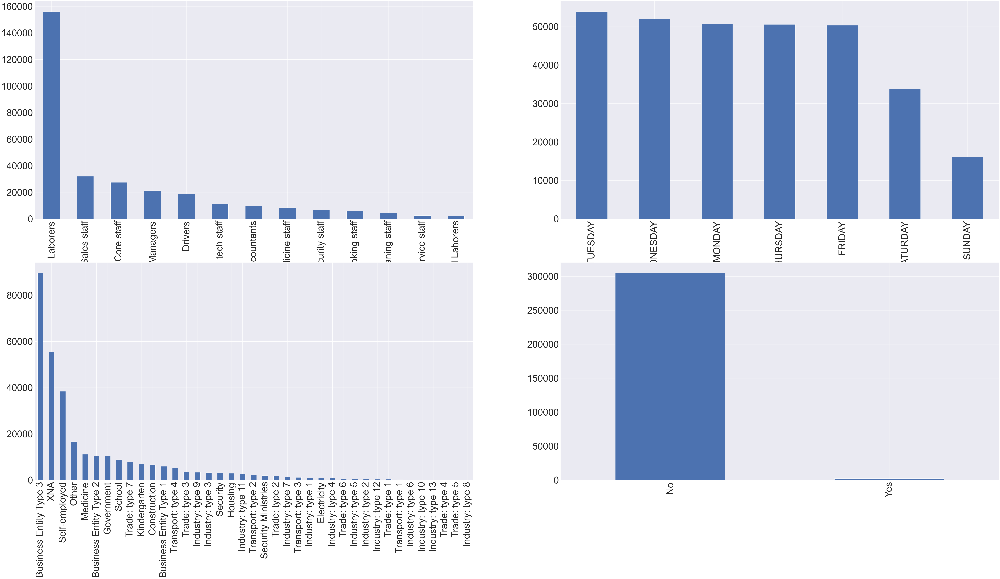

In [31]:
plt.figure(figsize = (100,50))
sns.set(font_scale = 5)
plt.subplot(221)
print(df_cat['OCCUPATION_TYPE'].value_counts().plot(kind="bar"))
plt.subplot(222)
print(df_cat['WEEKDAY_APPR_PROCESS_START'].value_counts().plot(kind="bar"))
plt.subplot(223)
print(df_cat['ORGANIZATION_TYPE'].value_counts().plot(kind="bar"))
plt.subplot(224)
print(df_cat['EMERGENCYSTATE_MODE'].value_counts().plot(kind="bar"))

It is seen, the customers avail 'Revolving Loans' more than 'Cash Loans'. There are more 'female customers' as compared to men. Most of the customers own 'Car' and has ' Realty'. Most of the customers are 'married'. Most of them are 'working'. A lot of customers reside in 'Apartments'. A lot of them has completed their 'Secondary Education'. Most of the customers work as ' Labourers' under a ' Business Industry'. 

<AxesSubplot:xlabel='TARGET', ylabel='Density'>

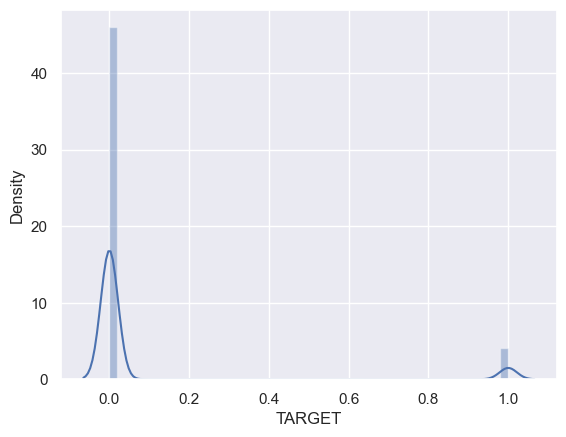

In [32]:
#checking if the target variable is normally distributed or not

sns.set(font_scale = 1)
sns.distplot(df["TARGET"])

### Bivariate Analysis

<AxesSubplot:xlabel='NAME_HOUSING_TYPE', ylabel='count'>

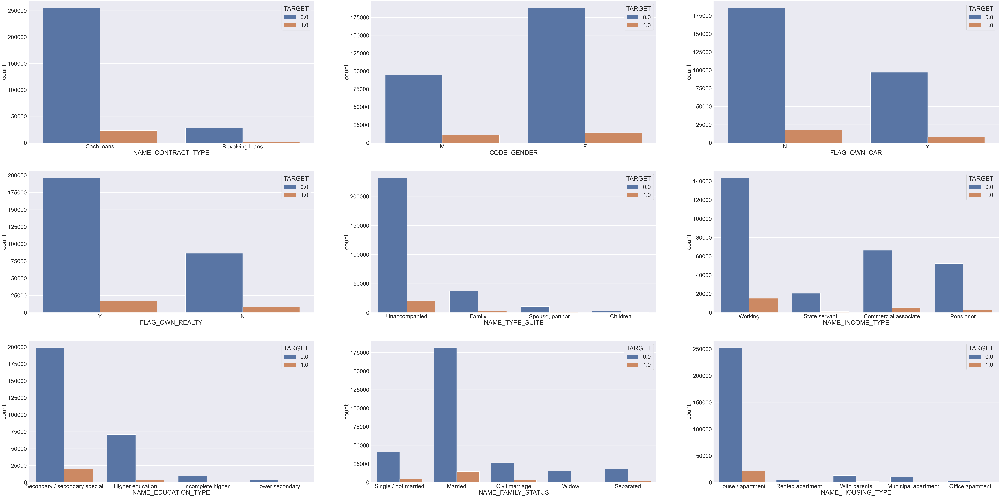

In [33]:
# plotting countplots between the variables and target variable

plt.figure(figsize = (100,50))
sns.set(font_scale = 3)
plt.subplot(331)
sns.countplot(df_cat['NAME_CONTRACT_TYPE'], hue = df_num['TARGET'])
plt.subplot(332)
sns.countplot(df_cat['CODE_GENDER'], hue = df_num['TARGET'])
plt.subplot(333)
sns.countplot(df_cat['FLAG_OWN_CAR'], hue = df_num['TARGET'])
plt.subplot(334)
sns.countplot(df_cat['FLAG_OWN_REALTY'], hue = df_num['TARGET'])
plt.subplot(335)
sns.countplot(df_cat['NAME_TYPE_SUITE'], hue = df_num['TARGET'])
plt.subplot(336)
sns.countplot(df_cat['NAME_INCOME_TYPE'], hue = df_num['TARGET'])
plt.subplot(337)
sns.countplot(df_cat['NAME_EDUCATION_TYPE'], hue = df_num['TARGET'])
plt.subplot(338)
sns.countplot(df_cat['NAME_FAMILY_STATUS'], hue = df_num['TARGET'])
plt.subplot(339)
sns.countplot(df_cat['NAME_HOUSING_TYPE'], hue = df_num['TARGET'])

<AxesSubplot:xlabel='EMERGENCYSTATE_MODE', ylabel='count'>

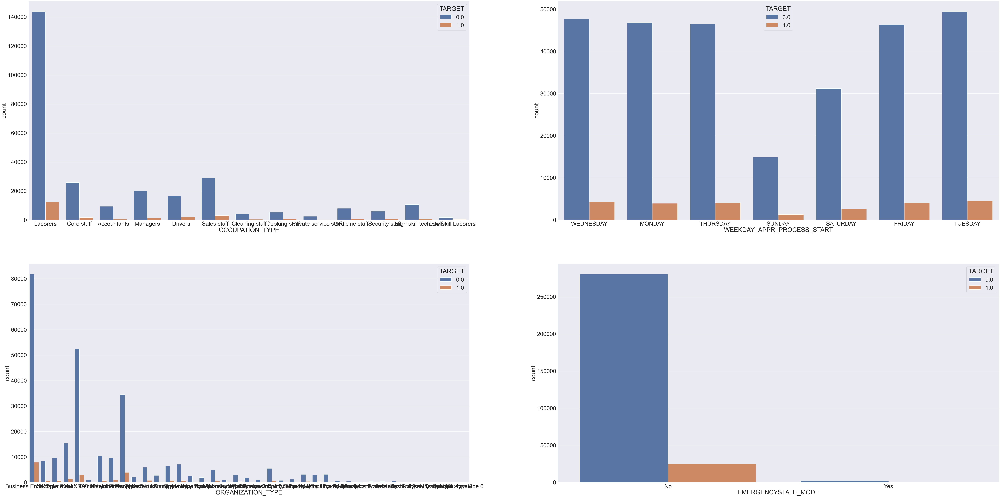

In [34]:
plt.figure(figsize = (100,50))
sns.set(font_scale = 3)
plt.subplot(221)
sns.countplot(df_cat['OCCUPATION_TYPE'], hue = df_num['TARGET'])
plt.subplot(222)
sns.countplot(df_cat['WEEKDAY_APPR_PROCESS_START'], hue = df_num['TARGET'])
plt.subplot(223)
sns.countplot(df_cat['ORGANIZATION_TYPE'], hue = df_num['TARGET'])
plt.subplot(224)
sns.countplot(df_cat['EMERGENCYSTATE_MODE'], hue = df_num['TARGET'])

People with 'cash loans' have a higer chance of being a loan defaulter. The 'female'customers are loan defaulters as compared to men. Customers who have car and realty value are bound to become defaulters. Most of the customers who are 'defaulters' are working as 'labourers'. Customers who are defaulters are unmarried. 

<AxesSubplot:xlabel='AMT_REQ_CREDIT_BUREAU_YEAR', ylabel='count'>

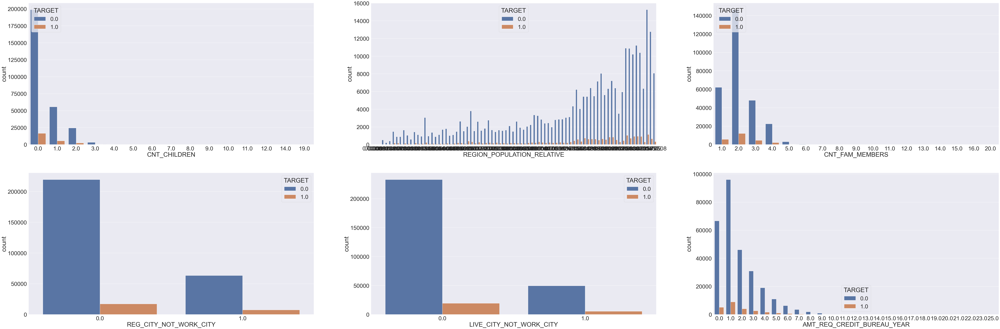

In [35]:
plt.figure(figsize = (100,50))
sns.set(font_scale = 3)
plt.subplot(331)
sns.countplot(df_num['CNT_CHILDREN'], hue = df_num['TARGET'])
plt.subplot(332)
sns.countplot(df_num['REGION_POPULATION_RELATIVE'], hue = df_num['TARGET'])
plt.subplot(333)
sns.countplot(df_num['CNT_FAM_MEMBERS'], hue = df_num['TARGET'])
plt.subplot(334)
sns.countplot(df_num['REG_CITY_NOT_WORK_CITY'], hue = df_num['TARGET'])
plt.subplot(335)
sns.countplot(df_num['LIVE_CITY_NOT_WORK_CITY'], hue = df_num['TARGET'])
plt.subplot(336)
sns.countplot(df_num['AMT_REQ_CREDIT_BUREAU_YEAR'], hue = df_num['TARGET'])

Customers who are defaulters, mostly have 2 family members. people who are defaulters, live in a city which is not their work city. Most of the deaulters have no children.

In [36]:
#using concatenation to frame the new df

fin_df = pd.concat([df_num, df_cat], axis = 1)
fin_df.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,EMERGENCYSTATE_MODE
0,1.000000,0.000000,202500.000000,406597.500000,24700.500000,351000.000000,0.018801,-9461.000000,-637.000000,-3648.000000,-2120.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.262949,0.139376,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,2.000000,2.000000,2.000000,2.000000,-1134.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,No
1,0.000000,0.000000,270000.000000,1293502.500000,35698.500000,1129500.000000,0.003541,-16765.000000,-1188.000000,-1186.000000,-291.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,2.000000,1.000000,1.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.622246,0.535276,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,1.000000,0.000000,1.000000,0.000000,-828.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,No
2,0.000000,0.000000,67500.000000,135000.000000,6750.000000,135000.000000,0.010032,-19046.000000,-225.000000,-4260.000000,-2531.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,2.000000,2.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.555912,0.729567,0.981600,0.166700,0.981600,0.166700,0.981600,0.166700,0.068800,0.000000,0.000000,0.000000,0.000000,-815.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,No
3,0.000000,0.000000,135000.000000,312682.500000,29686.500000,297000.000000,0.008019,-19005.000000,-3039.000000,-9833.000000,-2437.000000,1.000000,1.000000,0.000000

In [37]:
fin_df.shape

(307511, 80)

In [38]:
#using 'target encoding' to encode the categorical to numerical variables

import category_encoders as ce
tenc=ce.TargetEncoder() 
new_df=tenc.fit_transform(fin_df['CODE_GENDER'],fin_df['TARGET'])
final_df = new_df.join(fin_df.drop('CODE_GENDER',axis = 1))
final_df1=tenc.fit_transform(final_df['NAME_CONTRACT_TYPE'],final_df['TARGET'])
final_df2 = final_df1.join(final_df.drop('NAME_CONTRACT_TYPE',axis = 1))
final_df3=tenc.fit_transform(final_df2['FLAG_OWN_CAR'],final_df2['TARGET'])
final_df4 = final_df3.join(final_df2.drop('FLAG_OWN_CAR',axis = 1))
final_df5=tenc.fit_transform(final_df4['FLAG_OWN_REALTY'],final_df4['TARGET'])
final_df6 = final_df5.join(final_df4.drop('FLAG_OWN_REALTY',axis = 1))
final_df7=tenc.fit_transform(final_df6['NAME_TYPE_SUITE'],final_df6['TARGET'])
final_df8 = final_df7.join(final_df6.drop('NAME_TYPE_SUITE',axis = 1))
final_df9=tenc.fit_transform(final_df8['NAME_INCOME_TYPE'],final_df8['TARGET'])
final_df10 = final_df9.join(final_df8.drop('NAME_INCOME_TYPE',axis = 1))
final_df11=tenc.fit_transform(final_df10['NAME_EDUCATION_TYPE'],final_df10['TARGET'])
final_df12 = final_df11.join(final_df10.drop('NAME_EDUCATION_TYPE',axis = 1))
final_df13=tenc.fit_transform(final_df12['NAME_FAMILY_STATUS'],final_df12['TARGET'])
final_df14 = final_df13.join(final_df12.drop('NAME_FAMILY_STATUS',axis = 1))
final_df15=tenc.fit_transform(final_df14['NAME_HOUSING_TYPE'],final_df14['TARGET'])
final_df16 = final_df15.join(final_df14.drop('NAME_HOUSING_TYPE',axis = 1))
final_df17=tenc.fit_transform(final_df16['OCCUPATION_TYPE'],final_df16['TARGET'])
final_df18 = final_df17.join(final_df16.drop('OCCUPATION_TYPE',axis = 1))
final_df19=tenc.fit_transform(final_df18['WEEKDAY_APPR_PROCESS_START'],final_df18['TARGET'])
final_df20 = final_df19.join(final_df18.drop('WEEKDAY_APPR_PROCESS_START',axis = 1))
final_df21=tenc.fit_transform(final_df20['ORGANIZATION_TYPE'],final_df20['TARGET'])
final_df22 = final_df21.join(final_df20.drop('ORGANIZATION_TYPE',axis = 1))
final_df23=tenc.fit_transform(final_df22['EMERGENCYSTATE_MODE'],final_df22['TARGET'])
final_df24 = final_df23.join(final_df22.drop('EMERGENCYSTATE_MODE',axis = 1))
final_df24.head()

,EMERGENCYSTATE_MODE,ORGANIZATION_TYPE,WEEKDAY_APPR_PROCESS_START,OCCUPATION_TYPE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,FLAG_OWN_REALTY,FLAG_OWN_CAR,NAME_CONTRACT_TYPE,CODE_GENDER,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0.080614,0.087990,0.081604,0.080022,0.077963,0.098077,0.089346,0.095914,0.081828,0.079616,0.085002,0.083459,0.101419,1.000000,0.000000,202500.000000,406597.500000,24700.500000,351000.000000,0.018801,-9461.000000,-637.000000,-3648.000000,-2120.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.262949,0.139376,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,2.000000,2.000000,2.000000,2.000000,-1134.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
1,0.080614,0.059148,0.077572,0.063040,0.077963,0.075598,0.053551,0.057550,0.074946,0.083249,0.085002,0.083459,0.069992,0.000000,0.000000,270000.000000,1293502.500000,35698.500000,1129500.000000,0.003541,-16765.000000,-1188.000000,-1186.000000,-291.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,2.000000,1.000000,1.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.622246,0.535276,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,1.000000,0.000000,1.000000,0.000000,-828.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.080614,0.069781,0.077572,0.080022,0.077963,0.098077,0.089346,0.095914,0.081828,0.079616,0.072437,0.054783,0.101419,0.000000,0.000000,67500.000000,135000.000000,6750.000000,135000.000000,0.010032,-19046.000000,-225.000000,-4260.000000,-2531.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,2.000000,2.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.555912,0.729567,0.981600,0.166700,0.981600,0.166700,0.981600,0.166700,0.068800,0.000000,0.000000,0.000000,0.000000,-815.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.080614,0.087990,0.081604,0.080022,0.077963,0.099446,0.089346,0.095914,0.081828,0.079616,0.085002,0.083459,0.069992,0.000000,0.000000,135000.000000,312682.500000,29686.500000,297000.000000,0.008019,-19005.000000,-3

In [39]:
final_df24.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 80 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   EMERGENCYSTATE_MODE           307511 non-null  float64
 1   ORGANIZATION_TYPE             307511 non-null  float64
 2   WEEKDAY_APPR_PROCESS_START    307511 non-null  float64
 3   OCCUPATION_TYPE               307511 non-null  float64
 4   NAME_HOUSING_TYPE             307511 non-null  float64
 5   NAME_FAMILY_STATUS            307511 non-null  float64
 6   NAME_EDUCATION_TYPE           307511 non-null  float64
 7   NAME_INCOME_TYPE              307511 non-null  float64
 8   NAME_TYPE_SUITE               307511 non-null  float64
 9   FLAG_OWN_REALTY               307511 non-null  float64
 10  FLAG_OWN_CAR                  307511 non-null  float64
 11  NAME_CONTRACT_TYPE            307511 non-null  float64
 12  CODE_GENDER                   307511 non-nul

In [40]:
data = final_df24

In [41]:
#calculating the 5 point summary and displying the correlation through heatmap

data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
EMERGENCYSTATE_MODE,307511.000000,0.080729,0.001315,0.080614,0.080614,0.080614,0.080614,0.095790
ORGANIZATION_TYPE,307511.000000,0.080728,0.018060,0.031850,0.065845,0.087990,0.087990,0.157540
WEEKDAY_APPR_PROCESS_START,307511.000000,0.080729,0.001927,0.077572,0.078873,0.081469,0.081604,0.083505
OCCUPATION_TYPE,307511.000000,0.080729,0.016794,0.048303,0.067002,0.080022,0.080022,0.171524
NAME_HOUSING_TYPE,307511.000000,0.080729,0.010074,0.065724,0.077963,0.077963,0.077963,0.123131
NAME_FAMILY_STATUS,307511.000000,0.080729,0.011035,0.058242,0.075598,0.075598,0.081942,0.099446
NAME_EDUCATION_TYPE,307511.000000,0.080729,0.015597,0.053551,0.084850,0.089346,0.089346,0.109277
NAME_INCOME_TYPE,307511.000000,0.080729,0.017176,0.053864,0.057550,0.095914,0.095914,0.095914
NAME_TYPE_SUITE,307511.000000,0.080729,0.002454,0.073768,0.081828,0.081828,0.081828,0.081828
FLAG_OWN_REALTY,307511.000000,0.080729,0.001675,0.079616,0.079616,0.079616,0.083249,0.083249


In [42]:
data.corr()

,EMERGENCYSTATE_MODE,ORGANIZATION_TYPE,WEEKDAY_APPR_PROCESS_START,OCCUPATION_TYPE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,NAME_TYPE_SUITE,FLAG_OWN_REALTY,FLAG_OWN_CAR,NAME_CONTRACT_TYPE,CODE_GENDER,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
EMERGENCYSTATE_MODE,1.000000,0.001346,-0.000766,0.005691,0.000973,0.005531,0.015962,0.009390,-0.001349,0.008535,0.007584,0.000339,-0.005169,0.004829,0.004525,-0.002894,-0.004308,-0.003910,-0.004845,-0.029932,0.005434,-0.003571,-0.006273,0.006851,0.000158,0.003641,-0.001045,0.000300,-0.009291,-0.003251,-0.001047,0.017752,0.012061,-0.020088,-0.001307,-0.004134,-0.003543,-0.000976,-0.011447,-0.010459,-0.008622,-0.003394,-0.021885,-0.103087,-0.022042,-0.105982,-0.021667,-0.103068,-0.077968,0.003254,0.002542,0.003130,0.002786,0.003972,0.005202,0.004636,-0.000788,-0.002210,0.000795,-0.001210,-0.005687,-0.001246,-0.000417,-0.002468,-0.000223,-0.003929,0.000807,-0.001960,-0.004205,-0.001426,-0.001223,-0.002131,0.001365,0.004552,0.002937,-0.000399,0.000355,-0.004048,0.001635,0.001886
ORGANIZATION_TYPE,0.001346,1.000000,-0.004919,0.166275,0.089960,0.130494,-0.012528,0.585673,0.030726,0.046753,-0.151657,-0.038483,0.198574,0.066304,0.161322,0.052441,0.033167,0.086965,0.031727,-0.000705,0.460370,-0.691444,0.162098,0.203021,-0.002262,0.693542,0.152613,-0.006409,-0.030248,0.046427,0.157528,-0.023843,-0.021636,0.069665,0.028739,0.088983,0.080504,0.084293,0.205095,0.170628,-0.007553,-0.076878,-0.007000,0.003542,-0.006692,0.003256,-0.006866,0.003622,0.006451,-0.006693,-0.010362,-0.006756,-0.006864,0.005589,0.002342,0.152127,0.000302,0.014198,-0.420733,0.001580,0.127393,0.018028,0.000226,0.016974,0.001026,0.019209,0.014240,0.011910,0.033124,0.001999,0.006423,0.009923,0.007267,0.007680,-0.000771,-0.001461,-0.003560,0.010972,-0.005669,-0.015438
WEEKDAY_APPR_PROCESS_START,-0.000766,-0.004919,1.000000,0.000226,-0.002560,-0.000878,-0.001652,-0.006699,0.015059,-0.005132,-0.000690,0.006888,-0.002747,0.007074,-0.008371,0.002306,0.005788,0.006044,0.005944,-0.005237,-0.017038,0.013940,-0.006163,-0.002369,-0.000693,-0.013983,-0.001177,0.013722,0.001146,-0.000247,-0.008382,0.002114,0.003055,0.019365,0.000297,-0.000298,-0.000422,-0.003893,-0.001895,-0.000432,0.001010,0.001204,-0.000322,-0.006749,-0.000202,-0.006959,-0.000510,-0.006578,-0.004831,-0.004465,-0.000601,-0.004459,-0.000286,0.001095,0.001802,0.000022,-0.001555,0.000516,0.007618,-0.000636,-0.004943,0.001567,-0.000662,0.009023,0.000760,-0.001215,0.001352,0.000145,0.002310,0.001434,0.003503,0.001559,0.002869,-0.001658,-0.007518,0.009405,0.001169,-0.005982,-0.003287,-0.003067
OCCUPATION_TYPE,0.005691,0.166275,0.000226,1.000000,0.023961,0.021739,0.259934,0.117717,-0.008400,0.003256,-0.034291,0.031629,0.214036,0.061647,-0.010434,-0.

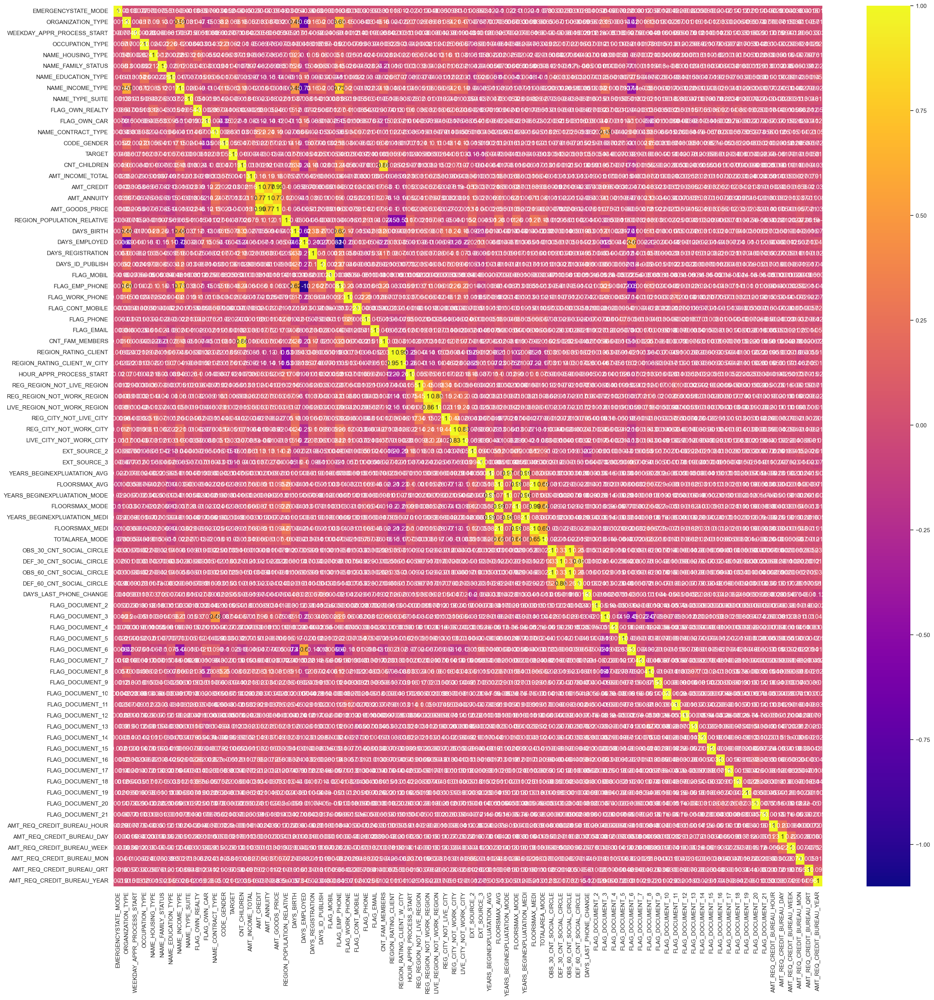

In [43]:
plt.figure(figsize=(30,30))
sns.set(font_scale = 1)
sns.heatmap(data.corr(),cmap='plasma',annot=True,vmin=1.0,vmax=-1.0,annot_kws={"size":12})
plt.show()

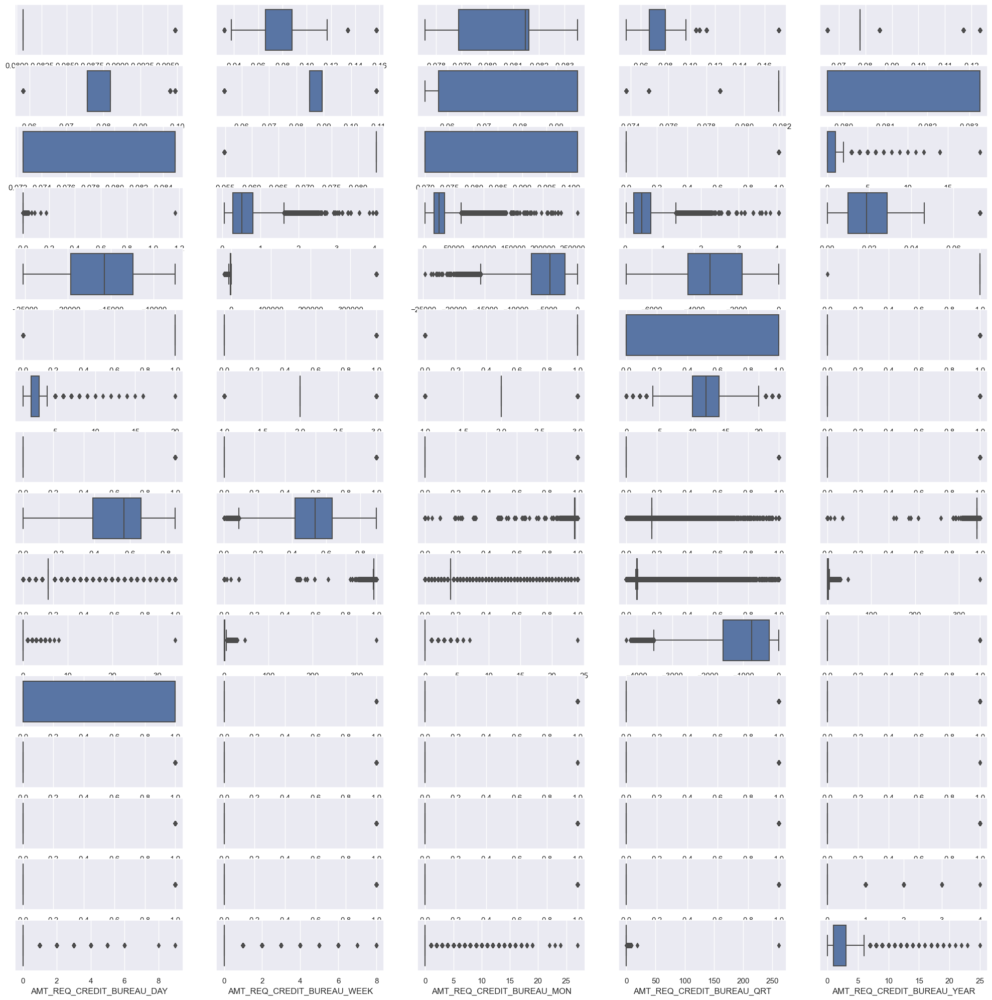

In [44]:
#plotting box plots for outlier detection

fig,ax = plt.subplots(16,5,figsize=(25,25))
sns.set(font_scale = 1)
for var,subplot in zip(data.columns,ax.flatten()):
    sns.set(font_scale = 1)
    sns.boxplot(data[var],ax=subplot)
    
plt.show()

In [45]:
# detecting and capping the outliers

for col in data.columns:
    percentiles = data[col].quantile([0.01,0.99]).values
    data[col][data[col] <= percentiles[0]] = percentiles[0]
    data[col][data[col] >= percentiles[1]] = percentiles[1]

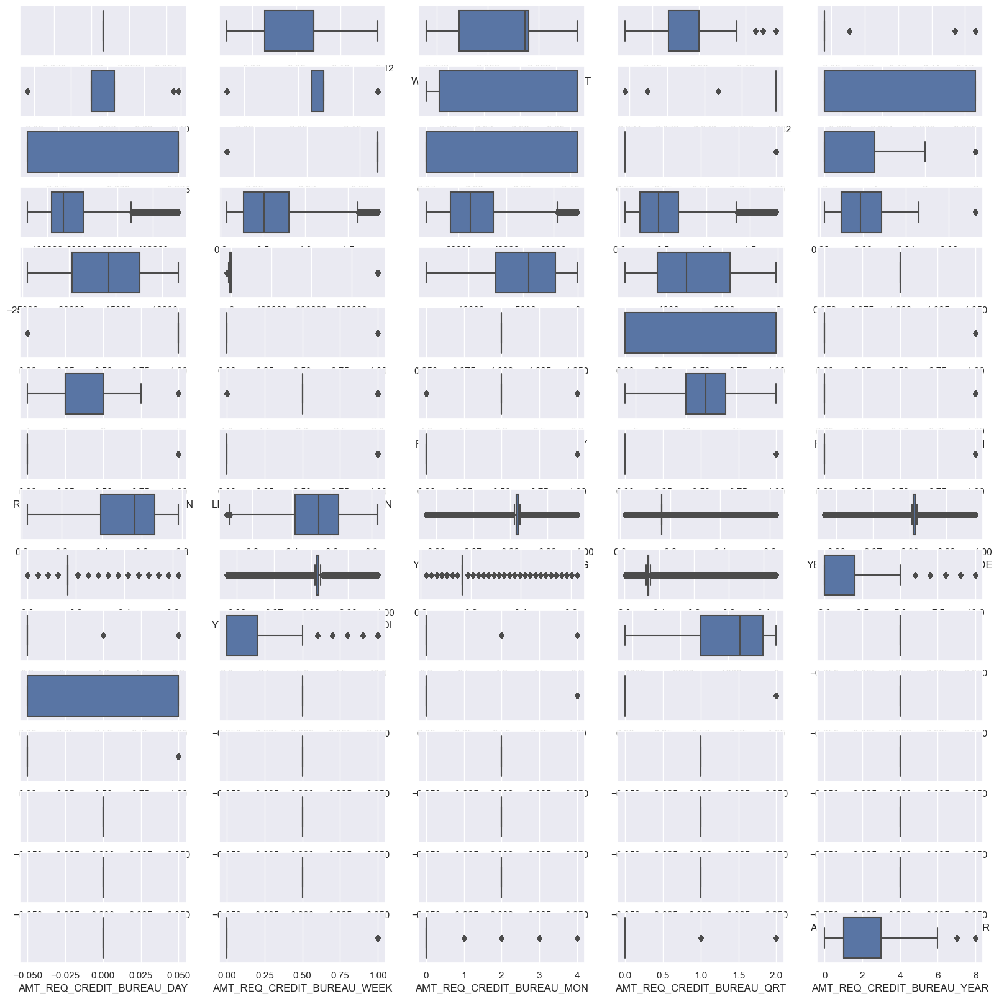

In [46]:
fig,ax = plt.subplots(16,5,figsize=(20,20))
sns.set(font_scale = 1)
for var,subplot in zip(data.columns,ax.flatten()):
    sns.set(font_scale = 1)
    sns.boxplot(data[var],ax=subplot)
    
plt.show()

# Model Building

## Model 1 - Using Standard Scaler

In [138]:
from sklearn.metrics import precision_score, recall_score, f1_score

### Train - test split

In [47]:
X = data.drop(['TARGET'], axis =1)
Y = data['TARGET']
#stratify = Y
x_train, x_test , y_train, y_test = train_test_split(X,Y, test_size = 0.30, random_state = 0, stratify = Y)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(215257, 79)
(92254, 79)
(215257,)
(92254,)


In [48]:
Cont = pd.crosstab(Y,y_test,margins = True)
Cont

TARGET,0.0,1.0,All
TARGET,,,
0.0,84806,0,84806
1.0,0,7448,7448
All,84806,7448,92254


In [49]:
scipy.stats.chi2_contingency(Cont)

(92254.0,
 0.0,
 4,
 array([[77959.30405186,  6846.69594814, 84806.        ],
        [ 6846.69594814,   601.30405186,  7448.        ],
        [84806.        ,  7448.        , 92254.        ]]))

The Chi2 = 92254, p value = 0, dof =4 for test set.

In [50]:
cont = pd.crosstab(Y,y_train,margins = True)
cont

TARGET,0.0,1.0,All
TARGET,,,
0.0,197880,0,197880
1.0,0,17377,17377
All,197880,17377,215257


In [51]:
scipy.stats.chi2_contingency(cont)

(215257.00000000003,
 0.0,
 4,
 array([[181905.78889421,  15974.21110579, 197880.        ],
        [ 15974.21110579,   1402.78889421,  17377.        ],
        [197880.        ,  17377.        , 215257.        ]]))

The Chi2 = 215257, p value = 0, dof =4 for train set.

In [52]:
#applying standard scaler to both train and test variables

X_scaler = StandardScaler()
X_train = X_scaler.fit_transform(x_train)
X_test = X_scaler.transform(x_test)

### Logistic Regression

In [53]:
regressor = LogisticRegression()
regressor.fit(X_train, y_train)

LogisticRegression()

In [54]:
#printing the RMSE and R square value

print('Coefficients:',regressor.coef_)
print('Intercept::', regressor.fit_intercept)
print('R^2 score: ', regressor.score(X_train,y_train))

Coefficients: [[-7.21529330e-17  1.39764144e-01  2.70577568e-02  7.21322495e-02
   1.03686178e-02  4.68270684e-02  1.33414518e-01  8.48443134e-02
   1.46299460e-02 -3.29666998e-02  1.23293048e-01 -9.04564307e-03
   1.72040619e-01  2.43777867e-02 -1.74658705e-02  8.88962963e-01
   1.58004496e-01 -1.01434162e+00  2.06636308e-02  6.62694590e-02
   3.17341170e+00  4.48012008e-02  6.28037452e-02  0.00000000e+00
   3.05383796e+00  6.18804439e-02  0.00000000e+00 -3.34295807e-02
  -1.93858175e-02 -1.95597259e-02 -8.56636973e-03  9.80803632e-02
  -8.06845863e-03 -2.81759480e-02  3.01922697e-02 -3.61397935e-02
   5.69531568e-02 -2.14332550e-02  2.86025591e-02 -3.90380024e-01
  -4.72777503e-01  3.28045090e-01 -3.07184931e-01 -9.13769132e-02
   1.38204990e-02 -2.77289156e-01  2.66270531e-01 -1.35379245e-02
   7.75216151e-02  5.71364147e-02 -7.48565349e-02  2.10466554e-02
   6.00133966e-02  0.00000000e+00  1.83444756e-01  0.00000000e+00
   4.77486136e-02  9.47660264e-02  0.00000000e+00  4.94053330e

In [145]:

Y_pred = regressor.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, Y_pred)))
print("rmse:",rmse)
accuracy = accuracy_score(y_test, Y_pred)
print("Accuracy:", accuracy)

rmse: 0.28415570795710243
Accuracy: 0.9192555336353979


In [57]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(y_test,regressor.predict(X_test))


0.015712419926341425

In [119]:
y_pred_proba = regressor.predict_proba(X_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.7422905644532528


In [146]:
precision = precision_score(y_test, Y_pred)
recall = recall_score(y_test, Y_pred)
f1 = f1_score(y_test, Y_pred)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.4965
Recall: 0.0095
F1 Score: 0.0187


There is slight agreement as the Kappa Score is 0.015. The accuracy is 0.91 which means it is a strong model. The AUC score signifies Good Discrimination between positive and negative instances. The precision is moderate while, recall and f1 score are much lower, which means all actual positives are false negatives.

### Decision Tree Classifier

In [141]:
model = DecisionTreeClassifier(criterion='entropy')
model.fit(X_train,y_train)
Pred = model.predict(X_test)
print(classification_report(y_test, Pred))
print('accuracy train :', model.score(X_train, y_train))
print('accuracy test :', model.score(X_test, y_test))

              precision    recall  f1-score   support

         0.0       0.93      0.92      0.92     84806
         1.0       0.15      0.16      0.15      7448

    accuracy                           0.86     92254
   macro avg       0.54      0.54      0.54     92254
weighted avg       0.86      0.86      0.86     92254

accuracy train : 1.0
accuracy test : 0.8564831877208576


In [59]:
cohen_kappa_score(y_test,model.predict(X_test))

0.07247917561031214

In [120]:
y_pred_proba = model.predict_proba(X_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.5380459991165025


In [142]:
precision = precision_score(y_test, Pred)
recall = recall_score(y_test, Pred)
f1 = f1_score(y_test, Pred)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.1463
Recall: 0.1608
F1 Score: 0.1532


There is slight agreement as the Kappa Score is 0.072. The accuracy is 0.86 which is great. The AUC score signifies poor Discrimination between positive and negative instances. The precision score, recall score and accuracy score are low.

### K-Nearest Neighbour (Confusion Matrix and ROC curve)

In [134]:
#user defined dunction for confusion matrix

from matplotlib.colors import ListedColormap
def plot_confusion_matrix(model):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred) 
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.show()

In [135]:
#user defined dunction for ROC model

def plot_roc(model):
    y_pred_prob = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.plot(fpr, tpr)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.plot([0, 1], [0, 1],'r--')
    plt.title('ROC curve for Admission Prediction Classifier', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
    plt.text(x = 0.02, y = 0.9, s = ('AUC Score:',round(roc_auc_score(y_test, y_pred_prob),4)))
    plt.grid(True)

In [168]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train,y_train)
knn_pred = knn_model.predict(X_test)
print(classification_report(y_test, knn_pred))
print('accuracy test :', knn_model.score(X_test, y_test))

              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95     84806
         1.0       0.19      0.02      0.04      7448

    accuracy                           0.91     92254
   macro avg       0.56      0.51      0.50     92254
weighted avg       0.86      0.91      0.88     92254

accuracy test : 0.9130769397532899


In [105]:
cohen_kappa_score(y_test,knn_model.predict(X_test))

0.025877962874739313

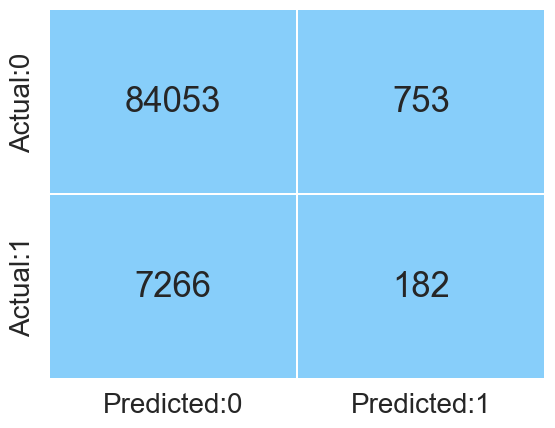

In [106]:
plot_confusion_matrix(knn_model)

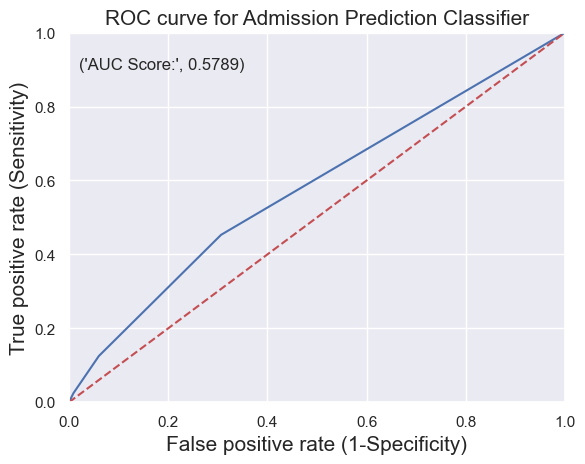

In [107]:
plot_roc(knn_model)

In [169]:
precision = precision_score(y_test, knn_pred)
recall = recall_score(y_test, knn_pred)
f1 = f1_score(y_test, knn_pred)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.1947
Recall: 0.0244
F1 Score: 0.0434


There is slight agreement as the Kappa Score is 0.025. The accuracy is 0.91 which means it is great fit. The AUC score signifies poor Discrimination between positive and negative instances. From the confusion matrix it is evident that, the TN>FN, but FP>TP which means it is not entirely accurate. The precision score, recall score and accuracy score are also low. That indiactes not all negatives are correctly predicted as well as maximum true positives are false negatives.

### Naive - Bayes Algorithm

In [70]:
nb_model = GaussianNB()
nb_model.fit(X_train,y_train)
nb_pred = nb_model.predict(X_test)
print(classification_report(y_test, nb_pred))
print('accuracy train :', nb_model.score(X_train, y_train))
print('accuracy test :', nb_model.score(X_test, y_test))

              precision    recall  f1-score   support

         0.0       0.94      0.78      0.85     84806
         1.0       0.16      0.46      0.23      7448

    accuracy                           0.76     92254
   macro avg       0.55      0.62      0.54     92254
weighted avg       0.88      0.76      0.80     92254

accuracy train : 0.7546885815560005
accuracy test : 0.7551759273310642


In [71]:
cohen_kappa_score(y_test,nb_model.predict(X_test))

0.12707462781125212

In [121]:
y_pred_proba = nb_model.predict_proba(X_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.6652285789417702


In [148]:
precision = precision_score(y_test, nb_pred)
recall = recall_score(y_test, nb_pred)
f1 = f1_score(y_test, nb_pred)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.1555
Recall: 0.4589
F1 Score: 0.2323


There is slight agreement as the Kappa Score is 0.12. The accuracy is 0.76 which means it is moderate fit. The AUC score signifies moderate Discrimination between positive and negative instances. The precision , and F1 score are low while the recall score is moderate which indicated that the rate of converrsion of false positive to true negative id lesser than incorrect true negative prediction.

### Random Forest Classifier

In [171]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_jobs=-1)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
print(classification_report(y_test, y_pred_rf))
print('accuracy train :', rf.score(X_train, y_train))
print('accuracy_test:', accuracy_score(y_test, y_pred_rf))

              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     84806
         1.0       0.74      0.00      0.00      7448

    accuracy                           0.92     92254
   macro avg       0.83      0.50      0.48     92254
weighted avg       0.90      0.92      0.88     92254

accuracy train : 0.9999767719516671
accuracy_test: 0.9193856092960739


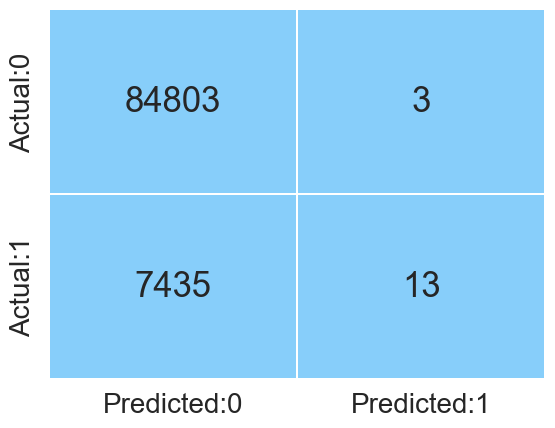

In [136]:
plot_confusion_matrix(rf)

In [176]:
cohen_kappa_score(y_test,rf.predict(X_test))

0.004055858064599405

In [175]:
y_pred_proba = rf.predict_proba(X_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.7106988655766381


In [149]:
precision = precision_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.8125
Recall: 0.0017
F1 Score: 0.0035


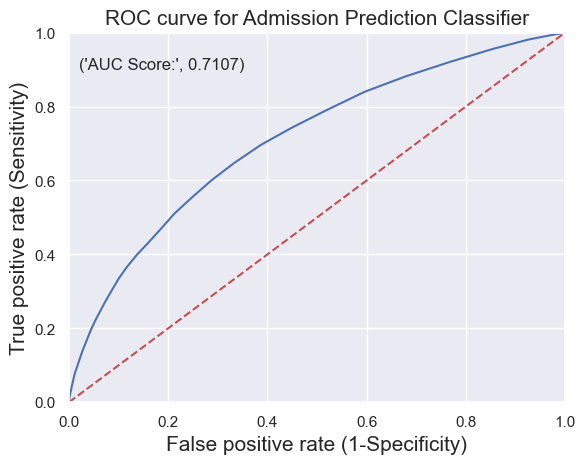

In [178]:
plot_roc(rf)

There is slight agreement as the Kappa Score is 0.003. The accuracy is 0.92 which means it is great fit. The AUC score signifies Good Discrimination between positive and negative instances. The precision is high ,while, recall and F1 score are low as well.This means that all false negatives are correctly predivted but true positives are incorrect. From the confusion matrix, it is evident that TN>FN znd TP>FP.

# Improving the accuracy

## Model 2 - apply SMOTE

### Oversampling

In [77]:
from imblearn.over_sampling import SMOTE
X, Y = SMOTE().fit_resample(X, Y)
from collections import Counter
print(sorted(Counter(Y).items()))

[(0.0, 282686), (1.0, 282686)]


In [78]:
x1_train, x1_test, y1_train, y1_test = train_test_split(X,Y, train_size=0.7,test_size=0.3,random_state=100, stratify = Y)
print(x1_train.shape)
print(x1_test.shape)
print(y1_train.shape)
print(y1_test.shape)

(395760, 79)
(169612, 79)
(395760,)
(169612,)


In [79]:
Cont = pd.crosstab(Y,y1_test,margins = True)
Cont

TARGET,0.0,1.0,All
TARGET,,,
0.0,84806,0,84806
1.0,0,84806,84806
All,84806,84806,169612


In [80]:
scipy.stats.chi2_contingency(Cont)

(169612.0,
 0.0,
 4,
 array([[ 42403.,  42403.,  84806.],
        [ 42403.,  42403.,  84806.],
        [ 84806.,  84806., 169612.]]))

The Chi2 value for train is: 169612, p value is 0 and DOF is 4

In [81]:
cont = pd.crosstab(Y,y1_train,margins = True)
cont

TARGET,0.0,1.0,All
TARGET,,,
0.0,197880,0,197880
1.0,0,197880,197880
All,197880,197880,395760


In [82]:
scipy.stats.chi2_contingency(cont)

(395760.0,
 0.0,
 4,
 array([[ 98940.,  98940., 197880.],
        [ 98940.,  98940., 197880.],
        [197880., 197880., 395760.]]))

The Chi2 value for train is: 395760, p value is 0 and DOF is 4

### Logistic Regression

In [83]:
Regressor = LogisticRegression()
Regressor.fit(x1_train, y1_train)

LogisticRegression()

In [85]:
print('Coefficients:',Regressor.coef_)
print('Intercept::', Regressor.fit_intercept)
print('R^2 score: ', Regressor.score(x1_train,y1_train))

Coefficients: [[ 8.02391003e-09  1.25850083e-08  8.13348501e-09  1.37706654e-08
   1.01726508e-08  1.04038062e-08  1.42526167e-08  1.22037625e-08
   8.14239138e-09  8.15636434e-09  9.10236023e-09  8.75329912e-09
   1.26413525e-08  8.57932680e-08 -1.56235247e-07  3.30363216e-06
   2.00513807e-05 -4.31613229e-06 -1.23947239e-09 -1.04929795e-05
  -1.01609522e-06  2.05716098e-05  3.66503729e-05  9.95350352e-08
   1.01566686e-07  1.03087092e-07  9.95350352e-08 -1.62362783e-08
  -7.68270275e-09  2.17923300e-07  4.08420829e-07  4.13207483e-07
   7.16378446e-07  5.21134948e-09  1.02883192e-08  4.11134767e-09
   8.01000605e-08  1.39338838e-07  8.18863429e-08 -1.52653023e-07
  -1.29122559e-07  9.70434031e-08 -7.97048494e-09  9.70576925e-08
  -7.41094507e-09  9.70312583e-08 -7.91634234e-09 -6.51325746e-09
   2.93792188e-07  1.06768909e-07  2.89230897e-07  8.46773844e-08
   1.82681054e-04  0.00000000e+00  1.46849867e-07  0.00000000e+00
   2.63263455e-09 -4.69452777e-09  0.00000000e+00 -2.28424748e

In [185]:
predict = Regressor.predict(x1_test)
RMSE = (np.sqrt(mean_squared_error(y1_test, predict)))
print("RMSE:",rmse)
Accuracy = accuracy_score(y1_test, predict)
print("Accuracy:", Accuracy)

RMSE: 0.28415570795710243
Accuracy: 0.5796464872768436


In [186]:
cohen_kappa_score(y1_test,Regressor.predict(x1_test))

0.1592929745536873

In [188]:
y_pred_proba = Regressor.predict_proba(x1_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y1_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.6087076215972639


In [151]:
precision = precision_score(y1_test, predict)
recall = recall_score(y1_test, predict)
f1 = f1_score(y1_test, predict)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.5882
Recall: 0.5312
F1 Score: 0.5582


After adding more samples, there is slight inter ratial agreement.The accuracy is 0.57 which means it is fair fit. The AUC score signifies moderate Discrimination between positive and negative instances. The precision , recall and F1 score are moderate.

### Hyper parameter Tuning

In [92]:
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(x1_train,y1_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             verbose=1)

In [93]:
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.sort_values('mean_test_score', ascending=False)[0:5]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
12,7.327949,0.016432,0.044094,0.006289,gini,10,50,50,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.896023,0.894027,0.893420,0.895517,0.892978,0.894393,0.001183,1
13,7.341623,0.045743,0.046300,0.005237,gini,10,50,100,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.896023,0.894027,0.893420,0.895517,0.892978,0.894393,0.001183,1
14,7.326018,0.064734,0.048156,0.000661,gini,10,100,50,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.893104,0.892372,0.891828,0.893218,0.892498,0.892604,0.000509,3
15,7.248986,0.025433,0.043328,0.007122,gini,10,100,100,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.893104,0.892372,0.891828,0.893218,0.892498,0.892604,0.000509,3
4,8.808229,0.091975,0.048083,0.001302,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.886699,0.889074,0.888392,0.886105,0.889630,0.887980,0.001360,5


In [94]:
cohen_kappa_score(y1_test,grid_search.predict(x1_test))

0.7926208051317124

In [183]:
y_pred_proba = grid_search.predict_proba(x1_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y1_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.9491671961623307


the Kappa score represents strong inter ratial agreement. The AUC score signifies strong discrimination between the positives and negatives.

### Decision Tree Classifier

In [95]:
Dt_model = DecisionTreeClassifier(max_depth=5,criterion='entropy',min_samples_leaf=50,min_samples_split=50)
Dt_model.fit(x1_train, y1_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=50,
                       min_samples_split=50)

In [153]:
Y_pred = Dt_model.predict(x1_test)

# Printing classification report
print(classification_report(y1_test, Y_pred))
print('accuracy train :', Dt_model.score(x1_train, y1_train))
print('accuracy test:', accuracy_score(y1_test, Y_pred))

              precision    recall  f1-score   support

         0.0       0.81      0.80      0.80     84806
         1.0       0.80      0.81      0.81     84806

    accuracy                           0.81    169612
   macro avg       0.81      0.81      0.81    169612
weighted avg       0.81      0.81      0.81    169612

accuracy train : 0.806683343440469
accuracy test: 0.8052908992288281


In [154]:
cohen_kappa_score(y1_test,Dt_model.predict(x1_test))

0.6105817984576563

In [191]:
y_pred_proba = Dt_model.predict_proba(x1_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y1_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.8852230441163278


In [155]:
precision = precision_score(y1_test, Y_pred)
recall = recall_score(y1_test, Y_pred)
f1 = f1_score(y1_test, Y_pred)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.8003
Recall: 0.8137
F1 Score: 0.8069


There is good agreement as the Kappa Score is 0.61. The accuracy is 0.81 which means it is good fit. The AUC score signifies strong Discrimination between positive and negative instances. The precision , recall and F1 score are high. The prediction rate is good.

In [131]:
def plot_Confusion_matrix(model):
    y_pred = model.predict(x1_test)
    cm = confusion_matrix(y1_test, y_pred) 
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.show()

In [132]:
def plot_Roc(model):
    y_pred_prob = model.predict_proba(x1_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y1_test, y_pred_prob)
    plt.plot(fpr, tpr)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.plot([0, 1], [0, 1],'r--')
    plt.title('ROC curve for Admission Prediction Classifier', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
    plt.text(x = 0.02, y = 0.9, s = ('AUC Score:',round(roc_auc_score(y1_test, y_pred_prob),4)))
    plt.grid(True)

### Random Forest Classifier

In [98]:
from sklearn.ensemble import RandomForestClassifier
RF=RandomForestClassifier(n_jobs=-1)
RF.fit(x1_train, y1_train)
y_pred_RF = RF.predict(x1_test)
print(classification_report(y1_test, y_pred_RF))
print('accuracy train :', RF.score(x1_train, y1_train))
print('accuracy_score:', accuracy_score(y1_test, y_pred_RF))

              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     84806
         1.0       1.00      0.91      0.95     84806

    accuracy                           0.96    169612
   macro avg       0.96      0.96      0.96    169612
weighted avg       0.96      0.96      0.96    169612

accuracy train : 0.9999924196482717
accuracy_score: 0.9559406174091456


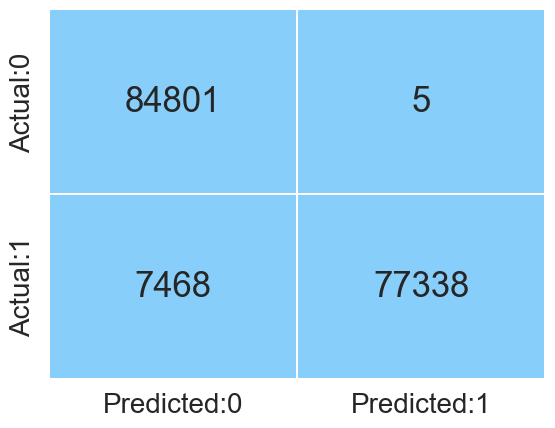

In [133]:
plot_Confusion_matrix(RF)

In [99]:
cohen_kappa_score(y1_test,RF.predict(x1_test))

0.9118812348182912

In [177]:
y_pred_proba = RF.predict_proba(x1_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y1_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.9785949106929542


In [157]:
precision = precision_score(y1_test, y_pred_RF)
recall = recall_score(y1_test, y_pred_RF)
f1 = f1_score(y1_test, y_pred_RF)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.9999
Recall: 0.9119
F1 Score: 0.9539


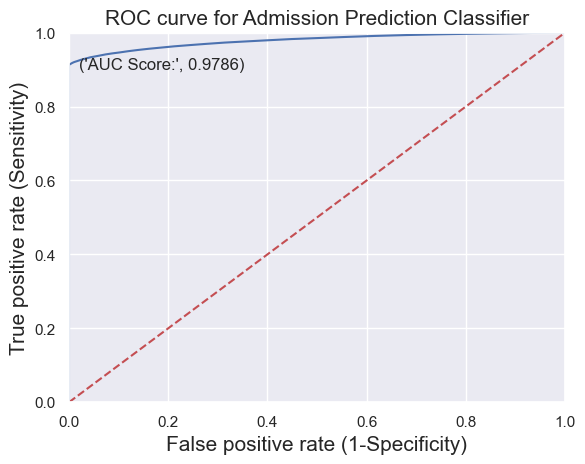

In [179]:
plot_Roc(RF)

There is almost perfect agreement as the Kappa Score is 0.91. The accuracy is 0.96 which means it is great fit. The AUC score signifies strong Discrimination between positive and negative instances. The precision , recall and F1 score are high. From the confusion matrix, it is evident that TN>FN and TP>FP. The prediction rate is excellent.

### K Nearest Neighbour Algorithm

In [113]:
KNN_model = KNeighborsClassifier(n_neighbors=5)
KNN_model.fit(x1_train,y1_train)
pred = KNN_model.predict(x1_test)
print(classification_report(y1_test, pred))
print('accuracy test :', KNN_model.score(x1_test, y1_test))

              precision    recall  f1-score   support

         0.0       0.95      0.69      0.80     84806
         1.0       0.76      0.97      0.85     84806

    accuracy                           0.83    169612
   macro avg       0.85      0.83      0.82    169612
weighted avg       0.85      0.83      0.82    169612

accuracy test : 0.8269521024455817


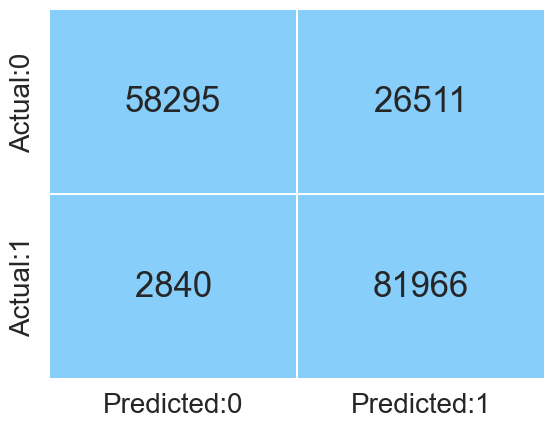

In [114]:
plot_Confusion_matrix(KNN_model)

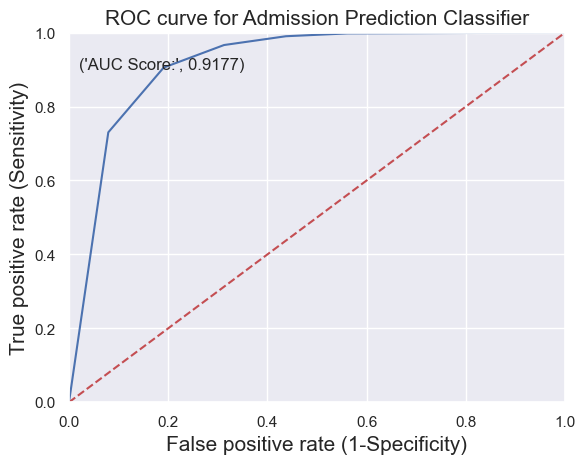

In [115]:
plot_roc(KNN_model)

In [116]:
cohen_kappa_score(y1_test,KNN_model.predict(x1_test))

0.6539042048911634

In [158]:
precision = precision_score(y1_test, pred)
recall = recall_score(y1_test, pred)
f1 = f1_score(y1_test, pred)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.7556
Recall: 0.9665
F1 Score: 0.8481


There is a good agreement as the Kappa Score is 0.65. The accuracy is 0.83 which means it is great fit. The AUC score signifies moderate Discrimination between positive and negative instances. The precision , recall and F1 score are ggod. From the confusion matrix, it is evident that TN>FN and TP>FP.

### Naive - Bayes Model

In [159]:
NB_model = GaussianNB()
NB_model.fit(x1_train,y1_train)
NB_pred = NB_model.predict(x1_test)
print(classification_report(y1_test, pred))
print('accuracy train :', NB_model.score(x1_train, y1_train))
print('accuracy test :', NB_model.score(x1_test, y1_test))

              precision    recall  f1-score   support

         0.0       0.95      0.69      0.80     84806
         1.0       0.76      0.97      0.85     84806

    accuracy                           0.83    169612
   macro avg       0.85      0.83      0.82    169612
weighted avg       0.85      0.83      0.82    169612

accuracy train : 0.6017788558722458
accuracy test : 0.6035127231563805


In [101]:
cohen_kappa_score(y1_test,NB_model.predict(x1_test))

0.20702544631276087

In [189]:
y_pred_proba = NB_model.predict_proba(x1_test)[:, 1]  # Probability of the positive class

# Calculate the AUC score
auc_score = roc_auc_score(y1_test, y_pred_proba)
print('AUC score:', auc_score)

AUC score: 0.6569274922590456


In [160]:
precision = precision_score(y1_test, NB_pred)
recall = recall_score(y1_test, NB_pred)
f1 = f1_score(y1_test, NB_pred)

# Print the results
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Precision: 0.5840
Recall: 0.7194
F1 Score: 0.6447


There is slight agreement as the Kappa Score is 0.20. The accuracy is 0.83 which means it is great fit. The AUC score signifies moderate Discrimination between positive and negative instances. The recall score is good while, the precision and f1 score are moderate. 

## Model Summary

The best model is derived after SMOTE analysis. By using Random Forest Alogorithm, we have determined it. There is almost perfect agreement as the Kappa Score is 0.91. The accuracy is 0.96 which means it is great fit. The AUC score signifies strong Discrimination between positive and negative instances. The precision , recall and F1 score are high which indicates the correct prediction of positives and negatives. From the confusion matrix, it is evident that TN>FN and TP>FP.